In [1]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
biancaferreira_african_wildlife_path = kagglehub.dataset_download('biancaferreira/african-wildlife')

print('Data source import complete.')


100%|██████████| 448M/448M [00:21<00:00, 22.2MB/s]

Extracting files...


Data source import complete.


# Animal Detection

# Multi-class object detection

### This is a multi-class object detection problem. Let's solve it using state-of-the-art YOLOv8

In [2]:
# Importing necessary libraries
import os
import shutil
import cv2
import random
import matplotlib.pyplot as plt
import numpy as np
import copy
# import wandb

In [3]:
# Installing ultralytics
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 886.3/886.3 kB 50.9 MB/s eta 0:00:00


In [4]:
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


You will need a unique API key to log in to Weights & Biases.

1. If you don't have a Weights & Biases account, you can go to https://wandb.ai/site and create a FREE account.
2. Access your API key: https://wandb.ai/authorize.

There are two ways you can login using a Kaggle kernel:

1. Run a cell with `wandb.login()`. It will ask for the API key, which you can copy + paste in.
2. You can also use Kaggle secrets to store your API key and use the code snippet below to login. Check out this [discussion post](https://www.kaggle.com/product-feedback/114053) to learn more about Kaggle secrets.



In [7]:
# Defining data path and listing its contents
ip_datapath=biancaferreira_african_wildlife_path
os.listdir(ip_datapath)

['buffalo', 'elephant', 'rhino', 'zebra']

In [8]:
# Defining standard image size for YOLO v8
image_size=640

# Creating working directories

In [9]:
import os

# Creating paths for separate images and labels
curr_path = os.getcwd()
imgtrainpath = os.path.join(curr_path, 'images', 'train')
imgvalpath = os.path.join(curr_path, 'images', 'validation')
imgtestpath = os.path.join(curr_path, 'images', 'test')

labeltrainpath = os.path.join(curr_path, 'labels', 'train')
labelvalpath = os.path.join(curr_path, 'labels', 'validation')
labeltestpath = os.path.join(curr_path, 'labels', 'test')

# Creating directories for all paths defined (with exist_ok=True)
os.makedirs(imgtrainpath)
os.makedirs(imgvalpath )
os.makedirs(imgtestpath)
os.makedirs(labeltrainpath)
os.makedirs(labelvalpath)
os.makedirs(labeltestpath)



 Let's take images and labels of all the classes to working space and also rename them according to their class which can be buffalo, elephant, rhino or zebra.

In [10]:
for dirname in os.listdir(ip_datapath):
    dirpath=os.path.join(ip_datapath, dirname)
    for file in os.listdir(dirpath):
        filepath=os.path.join(dirpath, file)
        newname=dirname+'_'+file
        if file.endswith((".txt")): # if label file, take it to label train path
            shutil.copy(filepath, labeltrainpath)
            path=os.path.join(labeltrainpath, file)
            newpath=os.path.join(labeltrainpath, newname)
        elif file.endswith((".jpg", ".JPG")): # if image file, resize and take it to image train path
            img_resized=cv2.resize(cv2.imread(filepath), (image_size, image_size))
            path=os.path.join(imgtrainpath, file)
            cv2.imwrite(path, img_resized)
            newpath=os.path.join(imgtrainpath, newname)
        os.rename(path, newpath) # Rename the file (label or image)


In [11]:
# Checking the number of image and label files for all classes
len(os.listdir(imgtrainpath)), len(os.listdir(labeltrainpath))

(1504, 1504)

# Extracting and visualising test images

Let's create a difficult test set to see how good our model can be.

1. Of all the images, we will include those images in test set which have objects of different classes. So all test images will have at least 2 objects of different classes. For example, a buffalo and a zebra in a single image is qualified to be part of the test data set. There can be multiple objects too. So 2 elephants and 1 buffalo in a single image is also perfectly valid.

2. For the training and validation set, we will have images of only one object class. For example, any image in training and validation set can have one type of animal only, say rhino. Although there can be multiple rhinos in the same image.



In [12]:
# function to check if all elements in the list are actually the same
def are_all_elements_same(lst):
    if not lst:
        return True  # An empty list is considered to have all elements the same.

    first_element = lst[0]
    for element in lst[1:]:
        if element != first_element:
            return False

    return True

Let's extract all the images with different types of animals present in the same image

In [13]:
for file in os.listdir(labeltrainpath):
    classes_list=[]
    with open(os.path.join(labeltrainpath, file), "r") as f:
        for line in f:
            class_id,_,_,_,_=line.strip().split(" ")
            classes_list.append(class_id) # creating list of all unique animal types in given image

    # Checking if different types of animals are present in image
    if not are_all_elements_same(classes_list):
        filepath=os.path.join(labeltrainpath, file)
        newpath=os.path.join(labeltestpath, file)
        shutil.move(filepath, newpath) # moving label file to test path
        basename=os.path.splitext(file)[0]
        print(basename) # printing the image name
        imgfilename=basename+'.jpg'
        oldimgfilepath=os.path.join(imgtrainpath, imgfilename)
        newimgfilepath=os.path.join(imgtestpath, imgfilename)
        shutil.move(oldimgfilepath, newimgfilepath) # moving image to test path



elephant_288
buffalo_300
zebra_339
buffalo_299
buffalo_298
buffalo_273
buffalo_297
zebra_338
elephant_166
rhino_375
elephant_290
elephant_291
buffalo_301
rhino_256
rhino_238
buffalo_291
elephant_345
zebra_073


The above printed images are all those which have more than one type of animal in it, although the name suggests that there is just one animal. Let's check few of these images

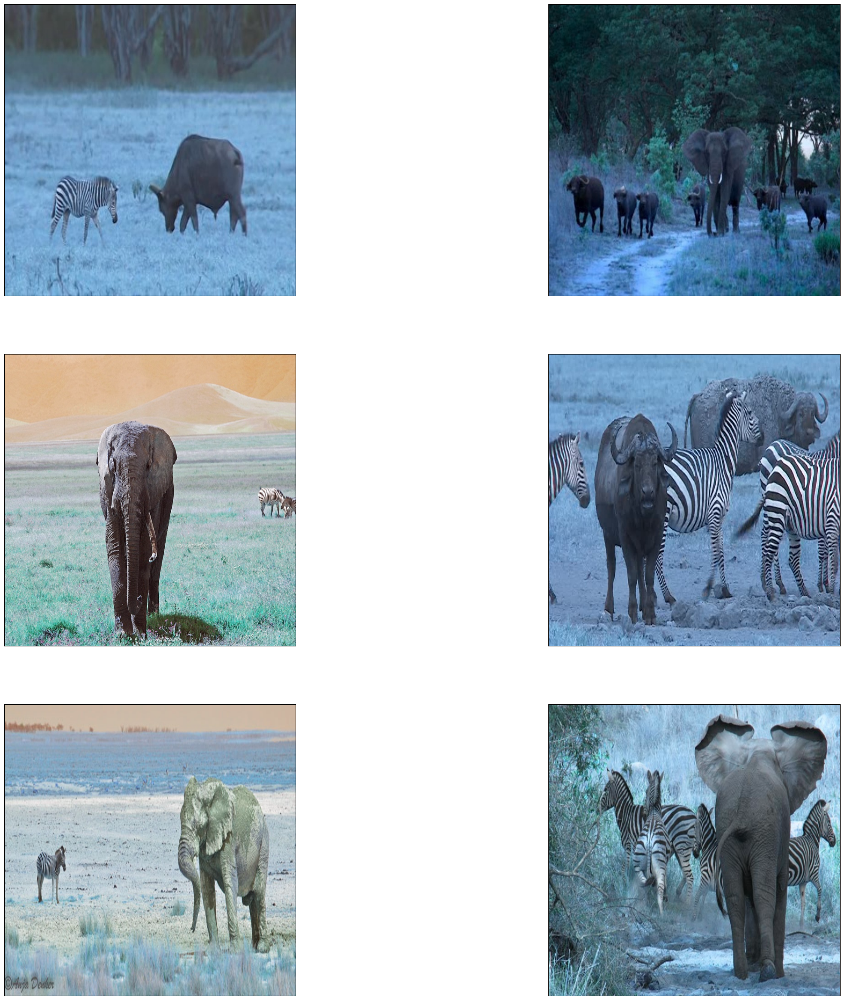

In [14]:
plt.figure(figsize=(30,30))
for i in range(6):
    test_image=os.path.join(imgtestpath, os.listdir(imgtestpath)[i])
    ax=plt.subplot(3,2,i+1)

    # Display actual image
    plt.imshow(cv2.imread(test_image))
    plt.xticks([])
    plt.yticks([])

We can see how the above images have different types of animals in the same image

In [15]:
# Checking the size of test dataset
len(os.listdir(imgtestpath)), len(os.listdir(labeltestpath))

(18, 18)

In [16]:
# Checking the size of training(+validation) dataset
len(os.listdir(imgtrainpath)), len(os.listdir(labeltrainpath))

(1486, 1486)

# Separating training and validation dataset

Let's now partition the training dataset into training and validation dataset

In [17]:
# moving 20% of data to validation

factor=0.2

for file in random.sample(os.listdir(imgtrainpath), int(len(os.listdir(imgtrainpath))*factor)):
    basename=os.path.splitext(file)[0]
    textfilename=basename+'.txt'
    labelfilepath=os.path.join(labeltrainpath, textfilename)
    labeldestpath=os.path.join(labelvalpath, textfilename)
    imgfilepath=os.path.join(imgtrainpath, file)
    imgdestpath=os.path.join(imgvalpath, file)
    shutil.move(imgfilepath, imgdestpath)
    shutil.move(labelfilepath, labeldestpath)

In [18]:
# Checking the size of training dataset
len(os.listdir(imgtrainpath)), len(os.listdir(labeltrainpath))

(1189, 1189)

In [19]:
# Checking the size of validation dataset
len(os.listdir(imgvalpath)), len(os.listdir(labelvalpath))

(297, 297)

# Image visualisation with bounding box

It's time to write a function to obtain bounding box coordinates of the images from the label files The label files contain information about image type, image centre coordinates and image size.

In [20]:
# function to obtain bounding box coordinates from text label files
def get_bbox_from_label(text_file_path):
    bbox_list=[]
    with open(text_file_path, "r") as file:
        for line in file:
            class_id,x_centre,y_centre,width,height=line.strip().split(" ")
            x1=(float(x_centre)+(float(width)/2))*image_size
            x0=(float(x_centre)-(float(width)/2))*image_size
            y1=(float(y_centre)+(float(height)/2))*image_size
            y0=(float(y_centre)-(float(height)/2))*image_size

            vertices=np.array([[int(x0), int(y0)], [int(x1), int(y0)],
                               [int(x1),int(y1)], [int(x0),int(y1)]])
            bbox_list.append(vertices)
    return tuple(bbox_list)

In [21]:
# defining red color in RGB to draw bounding box
red=(255,0,0)

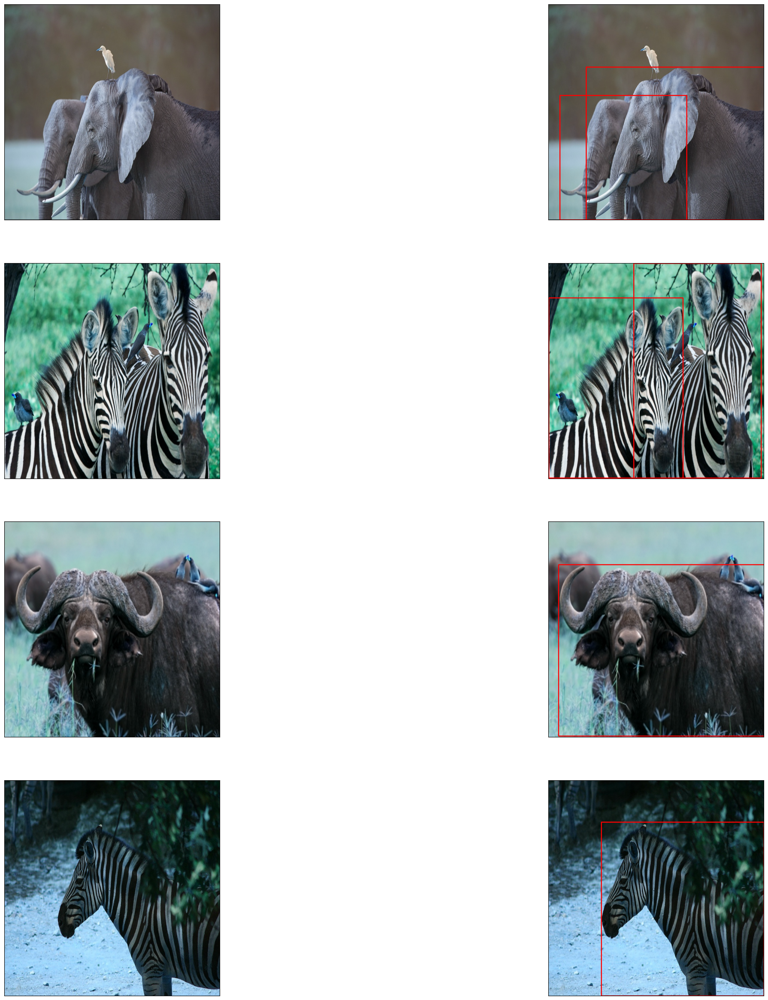

In [22]:
# Drawing bounding box for random images in training data
plt.figure(figsize=(30,30))
for i in range(1,8,2):
    k=random.randint(0, len(os.listdir(imgtrainpath))-1)
    img_path=os.path.join(imgtrainpath, sorted(os.listdir(imgtrainpath))[k])
    label_path=os.path.join(labeltrainpath, sorted(os.listdir(labeltrainpath))[k])
    bbox=get_bbox_from_label(label_path) # extracting bounding box coordinates
    image=cv2.imread(img_path)
    image_copy=copy.deepcopy(image)
    ax=plt.subplot(4, 2, i)
    plt.imshow(image) # displaying image
    plt.xticks([])
    plt.yticks([])
    cv2.drawContours(image_copy, bbox, -1, red, 2) # drawing bounding box on copy of image
    ax=plt.subplot(4, 2, i+1)
    plt.imshow(image_copy) # displaying image with bounding box
    plt.xticks([])
    plt.yticks([])

# Creating config file

In [23]:
# defining newline variable for config file
newline='\n'

Let's declare the contents of configuration file

In [24]:
# Starting with a comment in config file
ln_1='# Train/val/test sets'+newline

# train, val and test path declaration
ln_2='train: ' +"'"+imgtrainpath+"'"+newline
ln_3='val: ' +"'" + imgvalpath+"'"+newline
ln_4='test: ' +"'" + imgtestpath+"'"+newline
ln_5=newline
ln_6='# Classes'+newline

# names of the classes declaration
ln_7='names:'+newline
ln_8='  0: buffalo'+newline
ln_9='  1: elephant'+newline
ln_10='  2: rhino'+newline
ln_11='  3: zebra'

config_lines=[ln_1, ln_2, ln_3, ln_4, ln_5, ln_6, ln_7, ln_8, ln_9, ln_10, ln_11]

In [25]:
# Creating path for config file
config_path=os.path.join(curr_path, 'config.yaml')
config_path

'/content/config.yaml'

In [26]:
# Writing config file
with open(config_path, 'w') as f:
    f.writelines(config_lines)

# Model training

In [27]:
# Using YOLO's pretrained model architecture and weights for training
model=YOLO('yolov8m.yaml').load('yolov8m.pt')

100%|██████████| 49.7M/49.7M [00:00<00:00, 236MB/s]


Transferred 475/475 items from pretrained weights


In [28]:
# Training the model
results=model.train(data=config_path, epochs=100, iou=0.5, conf= 0.01)



Ultralytics 8.3.31 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.yaml, data=/content/config.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=yolov8m.pt, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=0.01, iou=0.5, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_bo

100%|██████████| 755k/755k [00:00<00:00, 45.9MB/s]


Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 112MB/s]


AMP: checks passed ✅


train: Scanning /content/labels/train... 1189 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1189/1189 [00:00<00:00, 1830.58it/s]

train: New cache created: /content/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 1.4.21 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/labels/validation... 297 images, 0 backgrounds, 0 corrupt: 100%|██████████| 297/297 [00:00<00:00, 735.56it/s]

val: New cache created: /content/labels/validation.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100       6.8G     0.8957      1.662      1.346         28        640: 100%|██████████| 75/75 [00:42<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]


                   all        297        504      0.482      0.467      0.418       0.25

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      6.86G      1.145      1.508      1.488         10        640: 100%|██████████| 75/75 [00:41<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.05it/s]

                   all        297        504      0.454      0.275      0.249      0.129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      6.83G      1.216      1.571      1.553         18        640: 100%|██████████| 75/75 [00:39<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.99it/s]

                   all        297        504      0.394       0.42      0.277      0.133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      6.85G      1.244      1.592      1.561         23        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.41it/s]

                   all        297        504      0.497      0.386      0.367       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      6.88G      1.183      1.489      1.529         16        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.44it/s]

                   all        297        504      0.491      0.446      0.452      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      6.75G      1.163      1.458      1.509         14        640: 100%|██████████| 75/75 [00:40<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.35it/s]

                   all        297        504      0.676      0.576      0.654      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      6.84G      1.117      1.343       1.47         15        640: 100%|██████████| 75/75 [00:40<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.49it/s]

                   all        297        504      0.768      0.709      0.771      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      6.83G      1.049      1.243      1.421         11        640: 100%|██████████| 75/75 [00:39<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.16it/s]

                   all        297        504      0.699      0.608      0.691      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      6.86G      1.022      1.182      1.411         21        640: 100%|██████████| 75/75 [00:40<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]

                   all        297        504      0.761       0.72      0.783      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      6.75G      1.028      1.192      1.415         19        640: 100%|██████████| 75/75 [00:40<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.80it/s]

                   all        297        504      0.823      0.708      0.823      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      6.86G      1.027      1.171      1.402         24        640: 100%|██████████| 75/75 [00:41<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.33it/s]

                   all        297        504      0.851      0.788      0.851      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      6.87G     0.9874      1.095      1.361         17        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.47it/s]

                   all        297        504      0.759      0.679      0.793      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      6.86G     0.9595      1.065      1.355         15        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.47it/s]

                   all        297        504      0.802      0.805      0.857      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      6.76G      0.937      1.026      1.333         19        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.47it/s]

                   all        297        504      0.769      0.775      0.841      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      6.86G      0.937     0.9968      1.335         20        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.48it/s]

                   all        297        504      0.864      0.718      0.811      0.585



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      6.83G     0.9058     0.9533      1.321         25        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.42it/s]

                   all        297        504      0.871      0.842      0.892      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      6.87G     0.9132      0.975      1.314         13        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]

                   all        297        504      0.866      0.753      0.852       0.66



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      6.76G     0.9018     0.9534      1.319          8        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.95it/s]

                   all        297        504      0.851      0.779      0.859      0.661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      6.85G     0.8683     0.9093      1.295         18        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.03it/s]

                   all        297        504      0.845      0.806      0.858      0.664



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      6.86G       0.85     0.9063      1.286         13        640: 100%|██████████| 75/75 [00:40<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.02it/s]

                   all        297        504      0.928      0.814      0.911      0.712



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      6.86G     0.8429      0.886      1.276         26        640: 100%|██████████| 75/75 [00:40<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.02it/s]

                   all        297        504      0.919      0.767       0.88      0.685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      6.75G     0.8398     0.8724      1.265         29        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.25it/s]

                   all        297        504      0.884      0.817      0.906      0.702



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      6.85G     0.8544     0.9154      1.289         13        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.31it/s]

                   all        297        504       0.88      0.781      0.878      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      6.85G     0.8249     0.8504       1.26         10        640: 100%|██████████| 75/75 [00:41<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.38it/s]

                   all        297        504      0.887      0.803      0.885      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      6.87G     0.8138     0.8029      1.248         12        640: 100%|██████████| 75/75 [00:40<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.03it/s]

                   all        297        504      0.906      0.837      0.907      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      6.74G      0.812     0.8347       1.25         10        640: 100%|██████████| 75/75 [00:40<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.15it/s]

                   all        297        504      0.848      0.817      0.873      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      6.87G     0.8137     0.8142      1.247         20        640: 100%|██████████| 75/75 [00:39<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.95it/s]

                   all        297        504      0.862      0.823      0.881      0.715



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      6.83G     0.7875     0.8002      1.233         16        640: 100%|██████████| 75/75 [00:40<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  2.00it/s]

                   all        297        504      0.908       0.83      0.915      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      6.87G     0.7779     0.8036      1.231         13        640: 100%|██████████| 75/75 [00:40<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.32it/s]

                   all        297        504      0.888      0.867      0.915      0.725



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      6.73G     0.7644     0.7455      1.218         15        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.50it/s]

                   all        297        504      0.905      0.845      0.921      0.727



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      6.86G     0.7702     0.7704      1.223         16        640: 100%|██████████| 75/75 [00:40<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.48it/s]

                   all        297        504      0.938      0.824      0.914      0.726



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      6.85G     0.7548      0.734      1.214         20        640: 100%|██████████| 75/75 [00:40<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.92it/s]

                   all        297        504      0.925      0.873      0.922      0.737



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      6.88G     0.7755     0.7474      1.227         20        640: 100%|██████████| 75/75 [00:40<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.00it/s]

                   all        297        504       0.93      0.863      0.922      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      6.76G     0.7455     0.7354      1.207         15        640: 100%|██████████| 75/75 [00:40<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.95it/s]

                   all        297        504      0.914      0.859      0.932      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      6.86G     0.7582      0.755      1.213         21        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.91it/s]

                   all        297        504      0.913       0.84      0.919      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      6.84G     0.7355     0.7014      1.196         22        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.99it/s]

                   all        297        504      0.936      0.869      0.937      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      6.87G     0.7281     0.7203      1.197         12        640: 100%|██████████| 75/75 [00:40<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.09it/s]

                   all        297        504      0.919      0.806      0.906      0.744



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      6.77G     0.7445     0.7278      1.212         26        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.26it/s]

                   all        297        504      0.879      0.854      0.902      0.735



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      6.83G     0.7312      0.691       1.19         19        640: 100%|██████████| 75/75 [00:40<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.92it/s]

                   all        297        504       0.92      0.857      0.924      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      6.85G     0.7046     0.6708      1.183         15        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]

                   all        297        504      0.859      0.844      0.902       0.75



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      6.87G     0.7006     0.6774      1.173         21        640: 100%|██████████| 75/75 [00:39<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.98it/s]

                   all        297        504      0.901      0.862      0.933       0.77



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      6.79G     0.7152     0.6596      1.176         22        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.19it/s]

                   all        297        504      0.912      0.843      0.917      0.751



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      6.86G     0.7114     0.6703      1.182         16        640: 100%|██████████| 75/75 [00:40<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.22it/s]

                   all        297        504       0.93      0.888      0.936      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      6.85G     0.7301      0.664      1.181         12        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.20it/s]

                   all        297        504      0.916      0.879      0.943      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      6.87G     0.6889     0.6398      1.163         24        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.42it/s]

                   all        297        504       0.92       0.88      0.938      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      6.76G     0.6824     0.6311      1.169         19        640: 100%|██████████| 75/75 [00:39<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.42it/s]

                   all        297        504      0.907      0.886      0.934       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      6.85G     0.6813     0.6355      1.162         21        640: 100%|██████████| 75/75 [00:39<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.95it/s]

                   all        297        504      0.937      0.865      0.926      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      6.81G     0.6706     0.5951      1.147         21        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.11it/s]

                   all        297        504      0.913      0.866      0.931      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100       6.9G     0.6634     0.6152      1.153         21        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.35it/s]

                   all        297        504      0.919      0.836      0.926      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      6.77G     0.6868     0.6353      1.158         26        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.49it/s]

                   all        297        504      0.943       0.86      0.928      0.775



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      6.86G     0.6646     0.6123      1.151         18        640: 100%|██████████| 75/75 [00:40<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.97it/s]

                   all        297        504      0.942       0.88      0.941      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      6.83G     0.6735     0.6008      1.163         17        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.21it/s]

                   all        297        504      0.937      0.873      0.938      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      6.84G     0.6608     0.6085      1.147         20        640: 100%|██████████| 75/75 [00:40<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.86it/s]

                   all        297        504      0.953      0.846      0.934      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      6.76G     0.6547     0.5818       1.14         19        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.13it/s]

                   all        297        504      0.933      0.866      0.942      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      6.84G     0.6437     0.5824      1.128          8        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.47it/s]

                   all        297        504      0.928      0.871      0.936      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      6.83G     0.6434     0.5656      1.127         23        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.46it/s]

                   all        297        504      0.942      0.874      0.938      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      6.87G     0.6404     0.5806      1.136         13        640: 100%|██████████| 75/75 [00:39<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.34it/s]

                   all        297        504      0.938      0.864       0.94      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      6.86G      0.634     0.5665      1.121         21        640: 100%|██████████| 75/75 [00:40<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]

                   all        297        504      0.946      0.891      0.944      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      6.86G     0.6174     0.5418      1.115         24        640: 100%|██████████| 75/75 [00:40<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.97it/s]

                   all        297        504      0.933      0.895      0.942      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      6.84G     0.6195     0.5495      1.121         14        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.99it/s]

                   all        297        504      0.932       0.87      0.932      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      6.87G     0.6111     0.5419       1.11         18        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.41it/s]

                   all        297        504      0.932      0.886      0.942      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      6.76G     0.6078     0.5432      1.113         32        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.35it/s]

                   all        297        504      0.919      0.886      0.931      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      6.86G     0.5996     0.5278      1.112         17        640: 100%|██████████| 75/75 [00:40<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.44it/s]

                   all        297        504      0.917      0.892      0.946      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      6.86G     0.6039     0.5272      1.109         17        640: 100%|██████████| 75/75 [00:40<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.51it/s]

                   all        297        504      0.924      0.895      0.936      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      6.88G     0.6042     0.5219      1.119         14        640: 100%|██████████| 75/75 [00:39<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]

                   all        297        504      0.927      0.899      0.943        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      6.76G     0.6191     0.5436      1.122         18        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.98it/s]

                   all        297        504       0.92      0.867      0.935      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      6.83G      0.596     0.5143      1.112         14        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.00it/s]

                   all        297        504      0.915      0.896      0.944      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      6.85G      0.606     0.5197      1.109         22        640: 100%|██████████| 75/75 [00:40<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.28it/s]

                   all        297        504      0.916      0.888      0.936      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100       6.9G     0.5875     0.5187      1.104         16        640: 100%|██████████| 75/75 [00:40<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.38it/s]

                   all        297        504      0.915      0.888      0.944      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      6.77G     0.5923     0.5114      1.097         11        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.48it/s]

                   all        297        504      0.936      0.901      0.948      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      6.85G     0.5902     0.5112      1.101         18        640: 100%|██████████| 75/75 [00:40<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.49it/s]

                   all        297        504      0.911      0.905      0.941      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      6.84G     0.5829     0.5054      1.087         25        640: 100%|██████████| 75/75 [00:39<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.29it/s]

                   all        297        504      0.909      0.924      0.949      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      6.84G     0.5616     0.4881      1.083         17        640: 100%|██████████| 75/75 [00:39<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]

                   all        297        504      0.941      0.899      0.945      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      6.77G     0.5657     0.4823      1.087         22        640: 100%|██████████| 75/75 [00:39<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.35it/s]

                   all        297        504      0.932      0.886      0.942      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      6.83G     0.5534     0.4663      1.084         25        640: 100%|██████████| 75/75 [00:39<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.90it/s]

                   all        297        504      0.933      0.903      0.949      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      6.85G     0.5694     0.4772      1.076         26        640: 100%|██████████| 75/75 [00:39<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.37it/s]

                   all        297        504      0.931      0.888      0.937      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      6.85G     0.5588      0.469      1.088         25        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.50it/s]

                   all        297        504      0.915      0.897      0.941      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      6.77G     0.5608     0.4719      1.085         21        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.94it/s]

                   all        297        504      0.938      0.888      0.947      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      6.84G      0.544      0.464      1.082         20        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.25it/s]

                   all        297        504      0.924      0.895      0.942      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      6.85G     0.5329      0.461      1.069         33        640: 100%|██████████| 75/75 [00:40<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.49it/s]

                   all        297        504      0.928       0.89      0.943      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      6.87G     0.5346      0.465      1.071          8        640: 100%|██████████| 75/75 [00:40<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.50it/s]

                   all        297        504      0.953      0.883      0.943      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      6.74G     0.5359     0.4564      1.073         28        640: 100%|██████████| 75/75 [00:39<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.30it/s]

                   all        297        504      0.946      0.871      0.942      0.816



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      6.84G     0.5357      0.445      1.062         19        640: 100%|██████████| 75/75 [00:39<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.49it/s]

                   all        297        504      0.949      0.878      0.939      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      6.83G      0.529     0.4372      1.059         19        640: 100%|██████████| 75/75 [00:40<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.49it/s]

                   all        297        504       0.94      0.885       0.94      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      6.88G     0.5312     0.4423       1.07         19        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.29it/s]

                   all        297        504      0.925      0.902      0.946      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      6.79G     0.5371     0.4434      1.065         25        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]

                   all        297        504      0.939      0.905      0.947      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      6.86G     0.5217     0.4296      1.062         16        640: 100%|██████████| 75/75 [00:40<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.98it/s]

                   all        297        504      0.946       0.88      0.946      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      6.85G      0.524     0.4331      1.058         15        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.38it/s]

                   all        297        504      0.939       0.89      0.944      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      6.89G     0.5197     0.4319      1.064         13        640: 100%|██████████| 75/75 [00:40<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.92it/s]

                   all        297        504       0.94      0.887      0.949      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      6.75G     0.5156     0.4123      1.057         13        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]

                   all        297        504       0.95      0.889      0.945      0.825


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      6.83G     0.3622     0.2641     0.9499         13        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.19it/s]

                   all        297        504      0.931      0.879      0.942      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      6.83G     0.3538     0.2395     0.9332         17        640: 100%|██████████| 75/75 [00:39<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.49it/s]

                   all        297        504      0.938      0.885      0.941      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      6.85G      0.345     0.2375     0.9343          6        640: 100%|██████████| 75/75 [00:40<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.47it/s]

                   all        297        504      0.934       0.89      0.941      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      6.77G     0.3412     0.2335     0.9197         11        640: 100%|██████████| 75/75 [00:39<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.97it/s]

                   all        297        504       0.94      0.882      0.949      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      6.84G     0.3274     0.2249     0.9154          7        640: 100%|██████████| 75/75 [00:40<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.05it/s]

                   all        297        504      0.945      0.874      0.943      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      6.82G     0.3362     0.2288     0.9248          8        640: 100%|██████████| 75/75 [00:39<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.21it/s]

                   all        297        504      0.942      0.887      0.944       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      6.86G     0.3273     0.2234     0.9213          6        640: 100%|██████████| 75/75 [00:39<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.94it/s]

                   all        297        504      0.939       0.89      0.941      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      6.74G     0.3179     0.2207     0.9072          7        640: 100%|██████████| 75/75 [00:40<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.98it/s]

                   all        297        504      0.952      0.878      0.945      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      6.83G     0.3091     0.2081     0.9018          9        640: 100%|██████████| 75/75 [00:40<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.97it/s]

                   all        297        504      0.932      0.895      0.946      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      6.82G      0.312      0.212     0.9027          8        640: 100%|██████████| 75/75 [00:40<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.38it/s]

                   all        297        504      0.933      0.892      0.946       0.83



100 epochs completed in 1.404 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train/weights/best.pt, 52.0MB

Validating runs/detect/train/weights/best.pt...
WARNING ⚠️ validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.31 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m summary (fused): 218 layers, 25,842,076 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.30it/s]


                   all        297        504      0.932      0.895      0.946      0.834
               buffalo         80        117      0.919      0.871      0.926       0.84
              elephant         81        157      0.946      0.894      0.954      0.808
                 rhino         60         83      0.928      0.938      0.967      0.901
                 zebra         76        147      0.937      0.878      0.938      0.786
Speed: 0.3ms preprocess, 10.0ms inference, 0.0ms loss, 4.0ms postprocess per image
Results saved to runs/detect/train


Results can be converted to a zip file using the following command which is commented right now. This zip file can be downloaded later if results are to be analysed locally

In [ ]:
# !zip -r results.zip /kaggle/working/runs/detect/train

mAP50 is the average precision value obtained by model at 50% IoU. This is the default metric used by YOLOv8 for object detection tasks.

Let's see how the training progressed with epochs by visualizing the plots

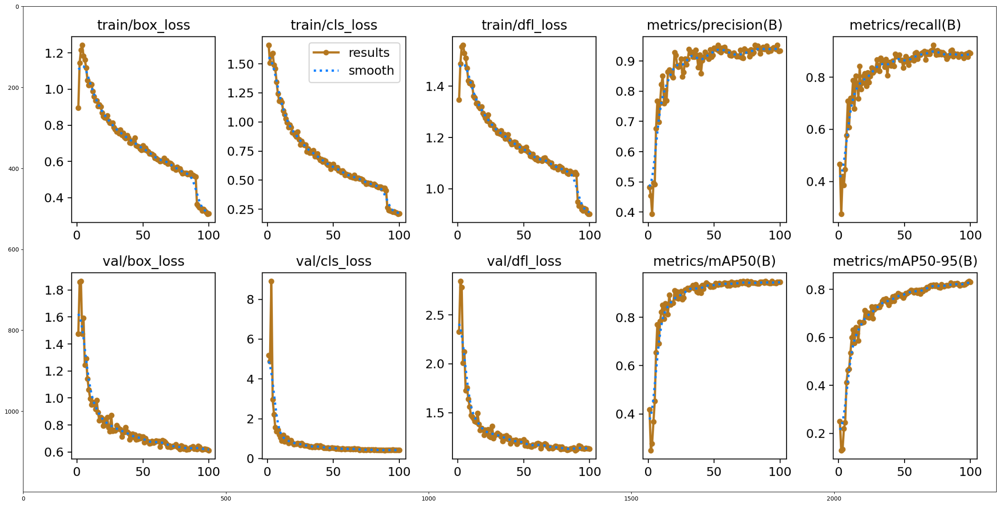

In [29]:
plt.figure(figsize=(30,30))
trainingresult_path=os.path.join(curr_path, 'runs', 'detect', 'train')
results_png=cv2.imread(os.path.join(trainingresult_path,'results.png'))
plt.imshow(results_png)

#### All losses- Box loss, class loss, dfl loss are decreasing with epochs.
#### All metrics- Precision, Recall, mAP50 and mAP50-95 are increasing with epochs

# Model Performance

 Let's write functions for evaluating model metrics and displaying plots

In [30]:
# function for evaluating model metrics map50
def evaluate_map50(trainedmodel, data_path, dataset='val'):
    metrics=trainedmodel.val(data=data_path, split=dataset)
    map50=round(metrics.box.map50, 3)
    print("The mAP of model for all images on {0} dataset is {1}".format(dataset,map50))
    return metrics, map50

In [31]:
# function for displaying plots created by YOLO
def display_curves(root_path):
    plt.figure(figsize=(50,50))

    #displaying p curve
    p_curve=cv2.imread(os.path.join(root_path,'P_curve.png'))
    ax=plt.subplot(5,1,1)
    plt.imshow(p_curve)

    #displaying r curve
    r_curve=cv2.imread(os.path.join(root_path,'R_curve.png'))
    ax=plt.subplot(5,1,2)
    plt.imshow(r_curve)

    #displaying pr curve
    pr_curve=cv2.imread(os.path.join(root_path,'PR_curve.png'))
    ax=plt.subplot(5,1,3)
    plt.imshow(pr_curve)

    #displaying f1 curve
    f1_curve=cv2.imread(os.path.join(root_path,'F1_curve.png'))
    ax=plt.subplot(5,1,4)
    plt.imshow(f1_curve)

    #displaying confusion matrix
    confusion_matrix=cv2.imread(os.path.join(root_path,'confusion_matrix.png'))
    ax=plt.subplot(5,1,5)
    plt.imshow(confusion_matrix)


In [32]:
# Evaluating train metrics
train_metrics, train_map50=evaluate_map50(model, config_path, dataset='train')

WARNING ⚠️ validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.31 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m summary (fused): 218 layers, 25,842,076 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /content/labels/train.cache... 1189 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1189/1189 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:35<00:00,  2.11it/s]


                   all       1189       2109      0.994      0.993      0.994      0.965
               buffalo        290        415      0.996      0.998      0.995      0.974
              elephant        291        578      0.991      0.997      0.995      0.959
                 rhino        309        471      0.998      0.998      0.995      0.978
                 zebra        299        645      0.992      0.981      0.992      0.949
Speed: 0.3ms preprocess, 22.1ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/detect/train2
The mAP of model for all images on train dataset is 0.994


Here we see class 'all' in addition to the 4 classes. 'all' here aggregates the true positives, false positives and false negatives across all classses to calculate a single precision and recall value for the entire dataset

Let me explain how P and R are defined for 'all':

Let's say I have the following counts for each class:

1. True Positives for Buffalo: TP_b

2. False Positives for Buffalo: FP_b

3. False Negatives for Buffalo: FN_b

Following the same for other classes as well: elephant, rhino, and zebra.

Now, I calculate the total true positives, total false positives, and total false negatives across all classes:

- Total True Positives (TP_t): TP_b + TP_z + TP_r + TP_e

- Total False Positives (FP_t): FP_b + FP_z + FP_r + FP_e

- Total False Negatives (FN_t): FN_b + FN_z + FN_r + FN_e

Now,

* P_all= TP_t/(TP_t + FP_t)
* R_all= TP_t/(TP_t + FN_t

In [33]:
# Path storing model's performance on training dataset
train_path=os.path.join(curr_path, 'runs', 'detect', 'val') #val is a misnomer, it is actually measuring validation on training dataset

In [35]:
# # Display plots on training data
# display_curves(train_path)

In [36]:
# Evaluating val metrics
val_metrics, val_map50=evaluate_map50(model, config_path, dataset='val')

WARNING ⚠️ validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.31 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/labels/validation.cache... 297 images, 0 backgrounds, 0 corrupt: 100%|██████████| 297/297 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:10<00:00,  1.76it/s]


                   all        297        504      0.932      0.895      0.946      0.835
               buffalo         80        117      0.919      0.871      0.926       0.84
              elephant         81        157      0.946      0.894      0.954       0.81
                 rhino         60         83      0.928      0.938      0.967      0.902
                 zebra         76        147      0.936      0.878      0.938      0.789
Speed: 0.4ms preprocess, 21.7ms inference, 0.0ms loss, 4.9ms postprocess per image
Results saved to runs/detect/train3
The mAP of model for all images on val dataset is 0.946


In [37]:
# Path storing model's performance on validation dataset
val_path=os.path.join(curr_path, 'runs', 'detect', 'val2')

In [39]:
# # Display plots on validation data
# display_curves(val_path)

In [40]:
# Evaluating test metrics
test_metrics, test_map50=evaluate_map50(model, config_path, dataset='test')

WARNING ⚠️ validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.31 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/labels/test... 18 images, 0 backgrounds, 0 corrupt: 100%|██████████| 18/18 [00:00<00:00, 273.18it/s]

val: New cache created: /content/labels/test.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.95it/s]


                   all         18         72      0.875      0.842      0.891      0.724
               buffalo          9         22      0.932      0.628      0.806      0.668
              elephant         11         13      0.916          1      0.979      0.906
                 rhino          3          5      0.853          1      0.995      0.833
                 zebra         14         32      0.798      0.739      0.786      0.491
Speed: 0.3ms preprocess, 33.6ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to runs/detect/train4
The mAP of model for all images on test dataset is 0.891


#### Obtained quite good mAP on a challenging test dataset

In [41]:
# Path storing model's performance on test dataset
test_path=os.path.join(curr_path, 'runs', 'detect', 'val3') #val3 is a misnomer, it is actually measuring validation on test dataset

In [43]:
# # Display plots on test data
# display_curves(test_path)

The above plots are not smooth because we have very less data (only 18 images) in test dataset

# Visualizing model's performance on random test images


image 1/1 /content/images/test/rhino_238.jpg: 640x640 2 elephants, 1 rhino, 37.8ms
Speed: 4.7ms preprocess, 37.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/images/test/elephant_290.jpg: 640x640 1 elephant, 4 zebras, 35.9ms
Speed: 2.5ms preprocess, 35.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/images/test/buffalo_299.jpg: 640x640 1 buffalo, 1 elephant, 1 zebra, 35.5ms
Speed: 2.8ms preprocess, 35.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


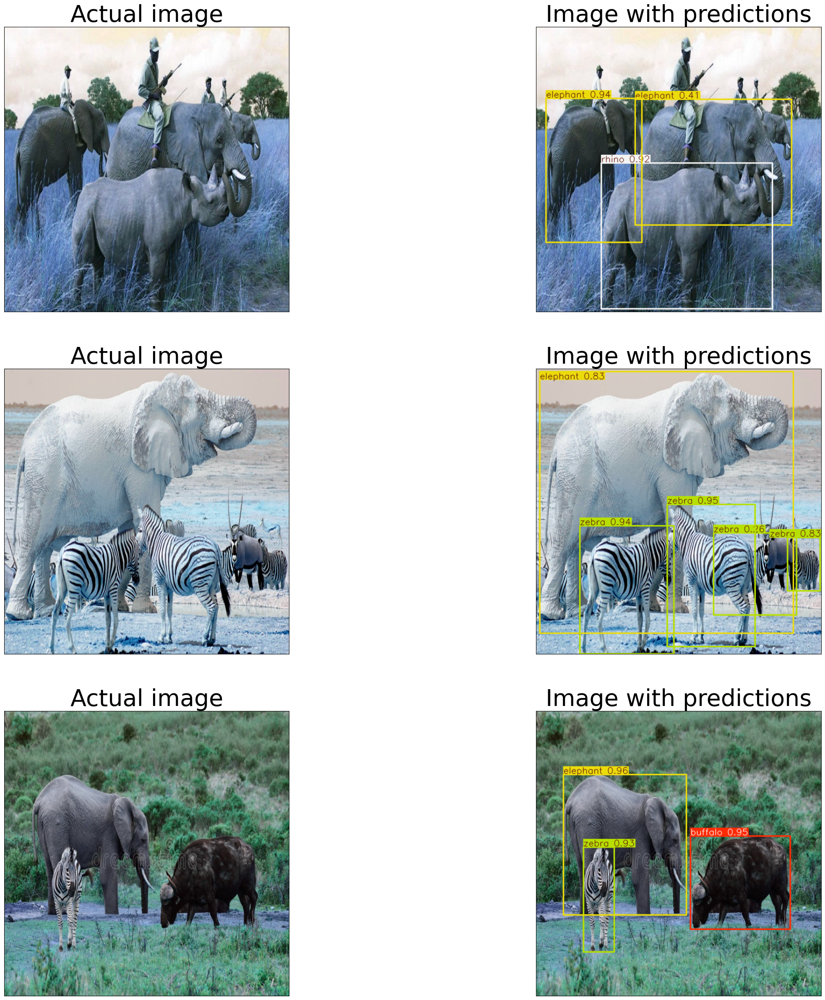

In [44]:
plt.figure(figsize=(30,30))
m=random.randint(0, 17) # Selecting random image number from 18 images in test dataset
for i in range(1,6,2):
    test_image=os.path.join(imgtestpath, os.listdir(imgtestpath)[m])
    ax=plt.subplot(3,2,i)

    # Display actual image
    plt.imshow(cv2.imread(test_image))
    plt.xticks([])
    plt.yticks([])
    plt.title("Actual image", fontsize = 40)

    # Predict
    res = model(test_image)
    res_plotted = res[0].plot()
    ax=plt.subplot(3,2,i+1)

    # Display image with predictions
    plt.imshow(res_plotted)
    plt.title("Image with predictions", fontsize = 40)
    plt.xticks([])
    plt.yticks([])
    m=m+1

In [46]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [47]:
save_path = "/content/drive/MyDrive/Classroom/trainedweight.pt"
model.save(save_path)

# Concluding remarks

Model's performance on a challenging test dataset is quite good as it is able to detect different types of wild animals present in the same image